<a href="https://colab.research.google.com/github/deokwoo-han/abc/blob/master/10_18_1_Object_detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Copyright 2018 The TensorFlow Hub Authors.

Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
# Copyright 2018 The TensorFlow Hub Authors. All Rights Reserved.
#
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
#     http://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.
# ==============================================================================

# Object Detection


<table class="tfo-notebook-buttons" align="left">
  <td>
    <a target="_blank" href="https://www.tensorflow.org/hub/tutorials/object_detection"><img src="https://www.tensorflow.org/images/tf_logo_32px.png" />View on TensorFlow.org</a>
  </td>
  <td>
    <a target="_blank" href="https://colab.research.google.com/github/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb"><img src="https://www.tensorflow.org/images/colab_logo_32px.png" />Run in Google Colab</a>
  </td>
  <td>
    <a target="_blank" href="https://github.com/tensorflow/hub/blob/master/examples/colab/object_detection.ipynb"><img src="https://www.tensorflow.org/images/GitHub-Mark-32px.png" />View on GitHub</a>
  </td>
  <td>
    <a href="https://storage.googleapis.com/tensorflow_docs/hub/examples/colab/object_detection.ipynb"><img src="https://www.tensorflow.org/images/download_logo_32px.png" />Download notebook</a>
  </td>
  <td>
    <a href="https://tfhub.dev/s?q=google%2Ffaster_rcnn%2Fopenimages_v4%2Finception_resnet_v2%2F1%20OR%20google%2Ffaster_rcnn%2Fopenimages_v4%2Finception_resnet_v2%2F1"><img src="https://www.tensorflow.org/images/hub_logo_32px.png" />See TF Hub models</a>
  </td>
</table>

This Colab demonstrates use of a TF-Hub module trained to perform object detection.

## Setup


In [ ]:
#@title Imports and function definitions

# For running inference on the TF-Hub module.
import tensorflow as tf

import tensorflow_hub as hub

# For downloading the image.
import matplotlib.pyplot as plt
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO

# For drawing onto the image.
import numpy as np
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps

# For measuring the inference time.
import time

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.6.0
The following GPU devices are available: /device:GPU:0


## Example use

### Helper functions for downloading images and for visualization.

Visualization code adapted from [TF object detection API](https://github.com/tensorflow/models/blob/master/research/object_detection/utils/visualization_utils.py) for the simplest required functionality.

In [ ]:
def display_image(image):
  fig = plt.figure(figsize=(20, 15))
  plt.grid(False)
  plt.imshow(image)


def download_and_resize_image(url, new_width=256, new_height=256,
                              display=False):
  _, filename = tempfile.mkstemp(suffix=".jpg")
  response = urlopen(url)
  image_data = response.read()
  image_data = BytesIO(image_data)
  pil_image = Image.open(image_data)
  pil_image = ImageOps.fit(pil_image, (new_width, new_height), Image.ANTIALIAS)
  pil_image_rgb = pil_image.convert("RGB")
  pil_image_rgb.save(filename, format="JPEG", quality=90)
  print("Image downloaded to %s." % filename)
  if display:
    display_image(pil_image)
  return filename


def draw_bounding_box_on_image(image,
                               ymin,
                               xmin,
                               ymax,
                               xmax,
                               color,
                               font,
                               thickness=4,
                               display_str_list=()):
  """Adds a bounding box to an image."""
  draw = ImageDraw.Draw(image)
  im_width, im_height = image.size
  (left, right, top, bottom) = (xmin * im_width, xmax * im_width,
                                ymin * im_height, ymax * im_height)
  draw.line([(left, top), (left, bottom), (right, bottom), (right, top),
             (left, top)],
            width=thickness,
            fill=color)

  # If the total height of the display strings added to the top of the bounding
  # box exceeds the top of the image, stack the strings below the bounding box
  # instead of above.
  display_str_heights = [font.getsize(ds)[1] for ds in display_str_list]
  # Each display_str has a top and bottom margin of 0.05x.
  total_display_str_height = (1 + 2 * 0.05) * sum(display_str_heights)

  if top > total_display_str_height:
    text_bottom = top
  else:
    text_bottom = top + total_display_str_height
  # Reverse list and print from bottom to top.
  for display_str in display_str_list[::-1]:
    text_width, text_height = font.getsize(display_str)
    margin = np.ceil(0.05 * text_height)
    draw.rectangle([(left, text_bottom - text_height - 2 * margin),
                    (left + text_width, text_bottom)],
                   fill=color)
    draw.text((left + margin, text_bottom - text_height - margin),
              display_str,
              fill="black",
              font=font)
    text_bottom -= text_height - 2 * margin


def draw_boxes(image, boxes, class_names, scores, max_boxes=10, min_score=0.1):
  """Overlay labeled boxes on an image with formatted scores and label names."""
  colors = list(ImageColor.colormap.values())

  try:
    font = ImageFont.truetype("/usr/share/fonts/truetype/liberation/LiberationSansNarrow-Regular.ttf",
                              25)
  except IOError:
    print("Font not found, using default font.")
    font = ImageFont.load_default()

  for i in range(min(boxes.shape[0], max_boxes)):
    if scores[i] >= min_score:
      ymin, xmin, ymax, xmax = tuple(boxes[i])
      display_str = "{}: {}%".format(class_names[i].decode("ascii"),
                                     int(100 * scores[i]))
      color = colors[hash(class_names[i]) % len(colors)]
      image_pil = Image.fromarray(np.uint8(image)).convert("RGB")
      draw_bounding_box_on_image(
          image_pil,
          ymin,
          xmin,
          ymax,
          xmax,
          color,
          font,
          display_str_list=[display_str])
      np.copyto(image, np.array(image_pil))
  return image

## Apply module

Load a public image from Open Images v4, save locally, and display.

Image downloaded to /tmp/tmp0m7lhhvi.jpg.


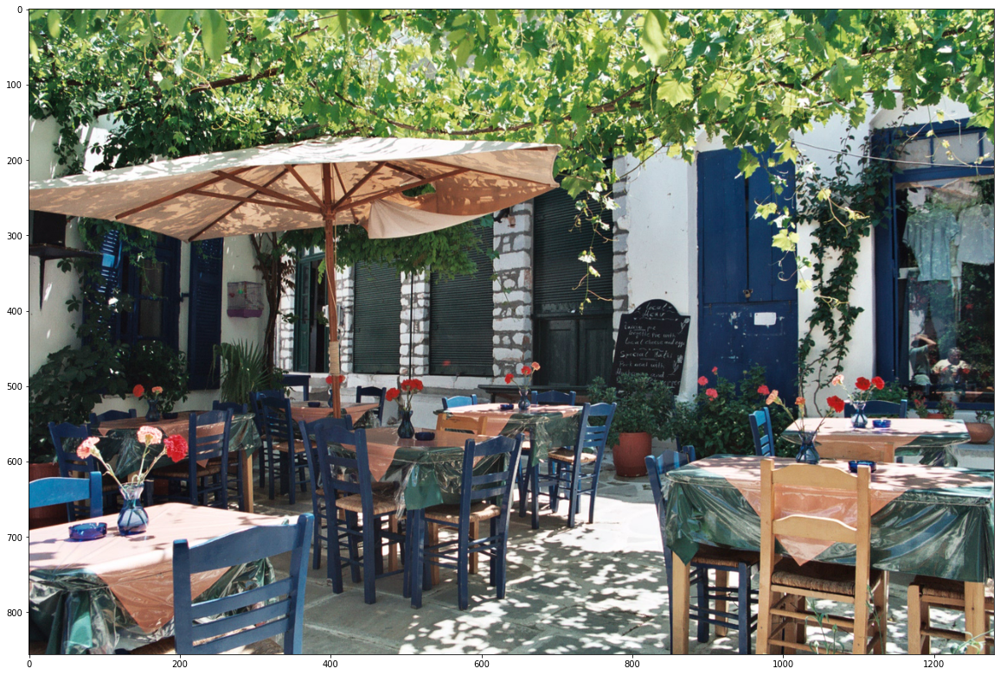

In [ ]:
# By Heiko Gorski, Source: https://commons.wikimedia.org/wiki/File:Naxos_Taverna.jpg
image_url = "https://upload.wikimedia.org/wikipedia/commons/6/60/Naxos_Taverna.jpg"  #@param
downloaded_image_path = download_and_resize_image(image_url, 1280, 856, True)

Pick an object detection module and apply on the downloaded image. Modules:
* **FasterRCNN+InceptionResNet V2**: high accuracy,
* **ssd+mobilenet V2**: small and fast.

In [ ]:
module_handle = "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1" #@param ["https://tfhub.dev/google/openimages_v4/ssd/mobilenet_v2/1", "https://tfhub.dev/google/faster_rcnn/openimages_v4/inception_resnet_v2/1"]
#텐서플로우와 파이토치 허브에 어떤 기능이 주어지는지 살펴보기
detector = hub.load(module_handle).signatures['default']

INFO:tensorflow:Saver not created because there are no variables in the graph to restore


INFO:tensorflow:Saver not created because there are no variables in the graph to restore


In [ ]:
def load_img(path):
  img = tf.io.read_file(path)
  img = tf.image.decode_jpeg(img, channels=3)
  return img

In [ ]:
def run_detector(detector, path):
  img = load_img(path)

  converted_img  = tf.image.convert_image_dtype(img, tf.float32)[tf.newaxis, ...]
  start_time = time.time()
  result = detector(converted_img)
  end_time = time.time()

  result = {key:value.numpy() for key,value in result.items()}

  print("Found %d objects." % len(result["detection_scores"]))
  print("Inference time: ", end_time-start_time)

  image_with_boxes = draw_boxes(
      img.numpy(), result["detection_boxes"],
      result["detection_class_entities"], result["detection_scores"])

  display_image(image_with_boxes)

Found 100 objects.
Inference time:  62.467116832733154


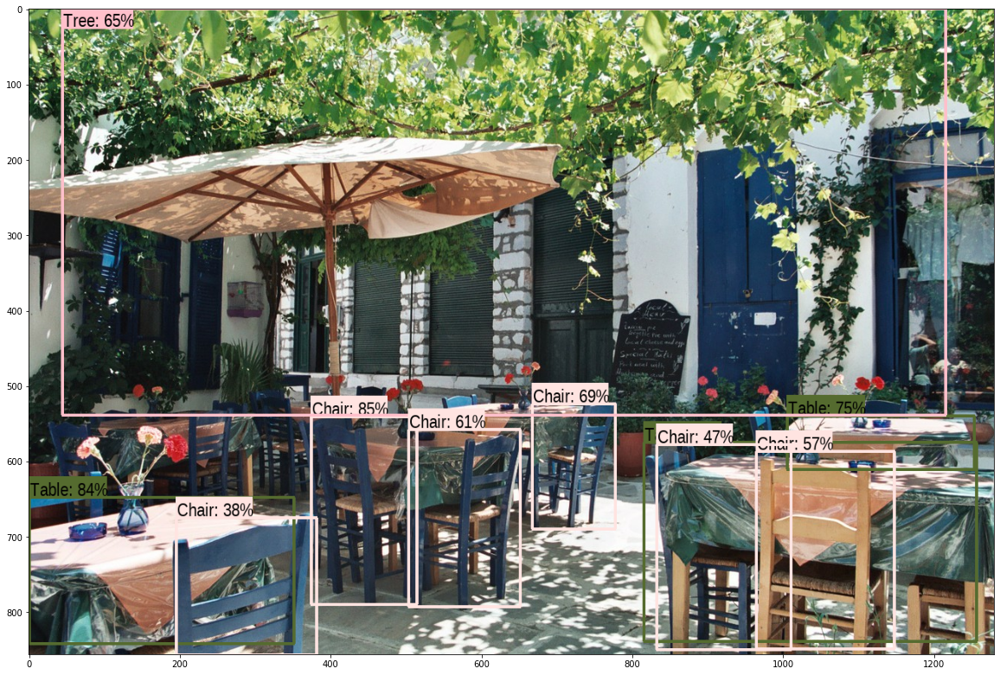

In [ ]:
run_detector(detector, downloaded_image_path)#이미지가 커서 시간이 오래 걸림
#100개 찾음, 파라솔과 창문은 못 찾음

In [ ]:
type(downloaded_image_path)

str

### More images
Perform inference on some additional images with time tracking.


In [ ]:
image_urls = [
  # Source: https://commons.wikimedia.org/wiki/File:The_Coleoptera_of_the_British_islands_(Plate_125)_(8592917784).jpg
  "https://upload.wikimedia.org/wikipedia/commons/1/1b/The_Coleoptera_of_the_British_islands_%28Plate_125%29_%288592917784%29.jpg",
  # By Américo Toledano, Source: https://commons.wikimedia.org/wiki/File:Biblioteca_Maim%C3%B3nides,_Campus_Universitario_de_Rabanales_007.jpg
  "https://upload.wikimedia.org/wikipedia/commons/thumb/0/0d/Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg/1024px-Biblioteca_Maim%C3%B3nides%2C_Campus_Universitario_de_Rabanales_007.jpg",
  # Source: https://commons.wikimedia.org/wiki/File:The_smaller_British_birds_(8053836633).jpg
  "https://upload.wikimedia.org/wikipedia/commons/0/09/The_smaller_British_birds_%288053836633%29.jpg",
  ]

def detect_img(image_url):
  start_time = time.time()
  image_path = download_and_resize_image(image_url, 640, 480)
  run_detector(detector, image_path)
  end_time = time.time()
  print("Inference time:",end_time-start_time)

Image downloaded to /tmp/tmpby8ourie.jpg.
Found 100 objects.
Inference time:  4.998617887496948
Inference time: 5.297283887863159


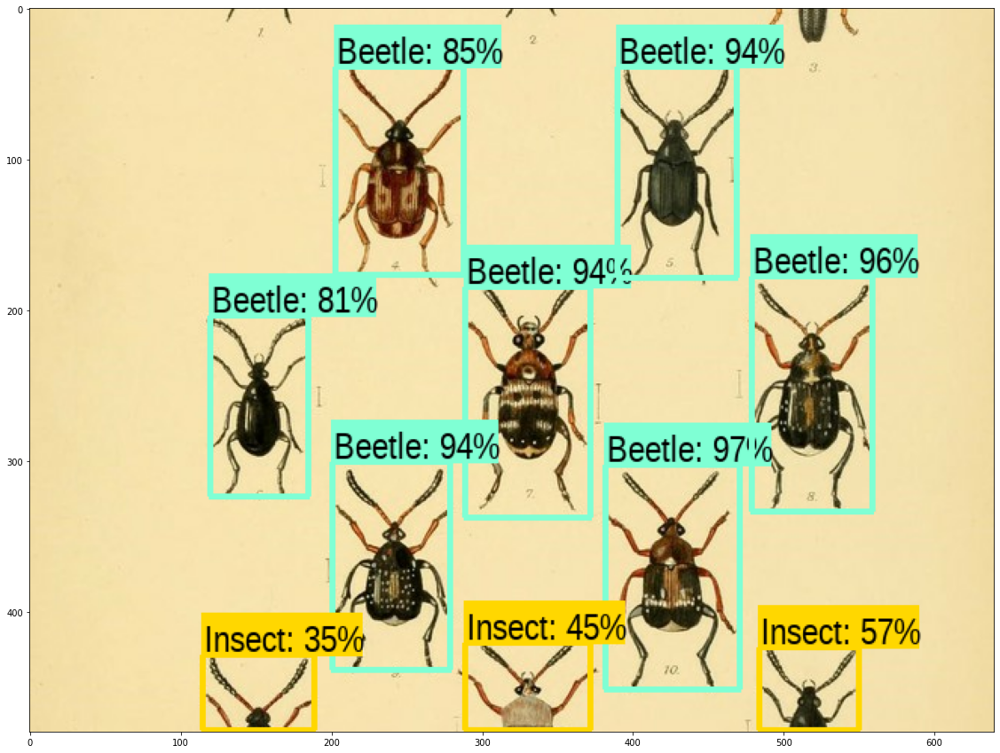

In [ ]:
detect_img(image_urls[0])

Image downloaded to /tmp/tmpqnob5ai8.jpg.
Found 100 objects.
Inference time:  2.748946189880371
Inference time: 3.0462772846221924


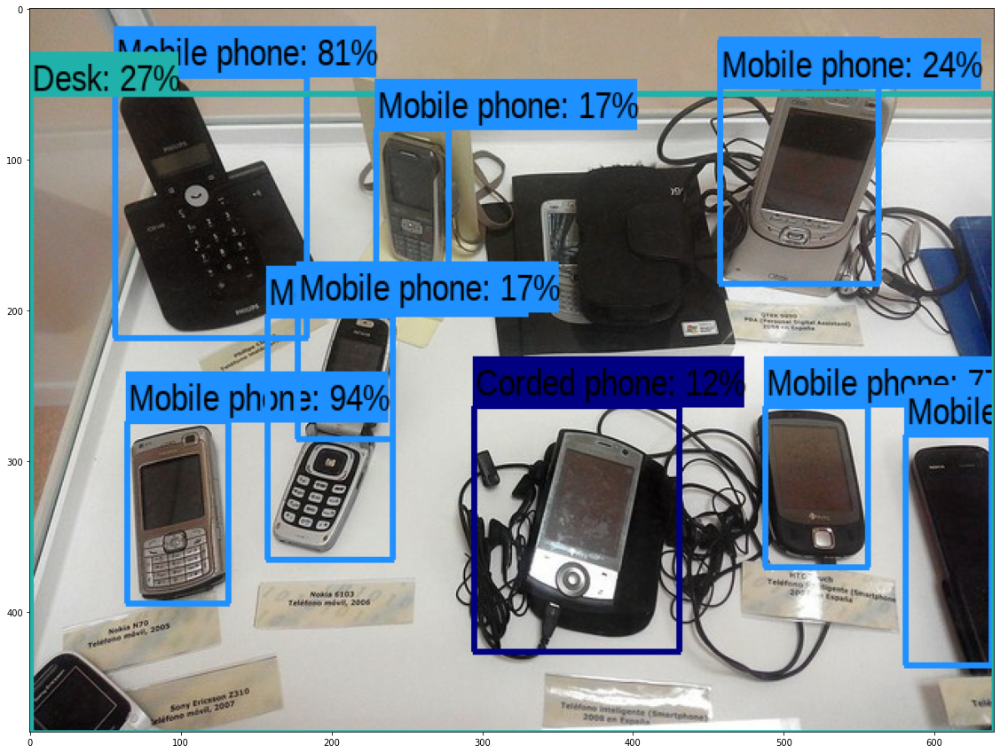

In [ ]:
detect_img(image_urls[1])

Image downloaded to /tmp/tmpdkqiye1d.jpg.
Found 100 objects.
Inference time:  2.6927480697631836
Inference time: 3.130420207977295


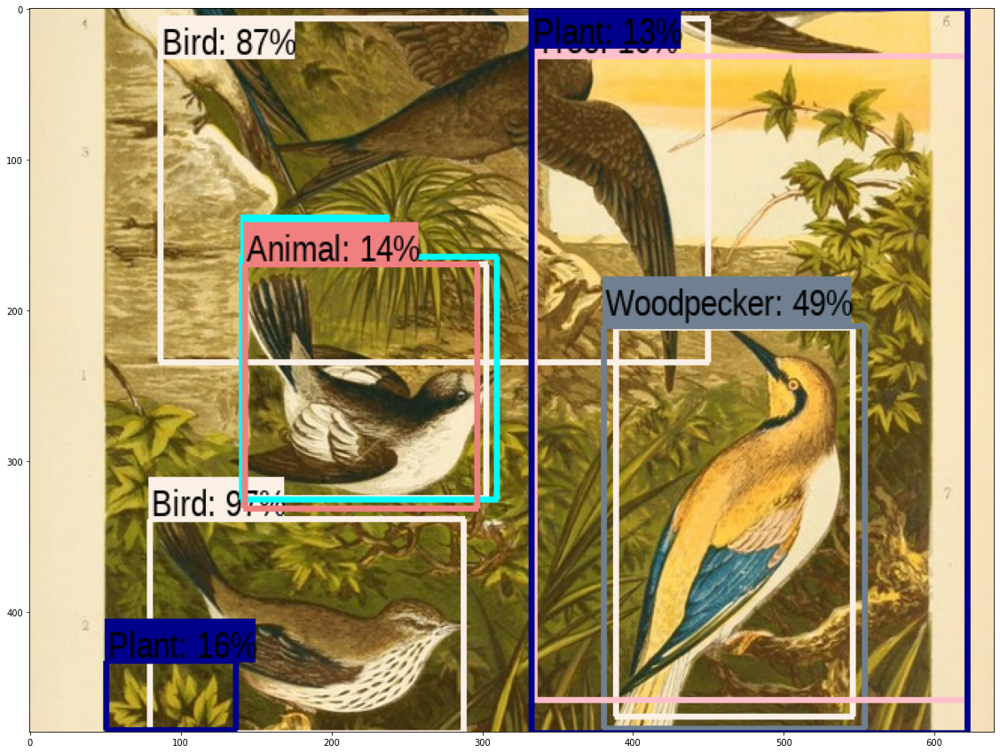

In [ ]:
detect_img(image_urls[2])#사람과 개로 중첨해서? 비전 태스크 중 오브젝트 디텍션

Image downloaded to /tmp/tmp482pbg2d.jpg.
Found 100 objects.
Inference time:  2.7626147270202637
Inference time: 2.9677743911743164


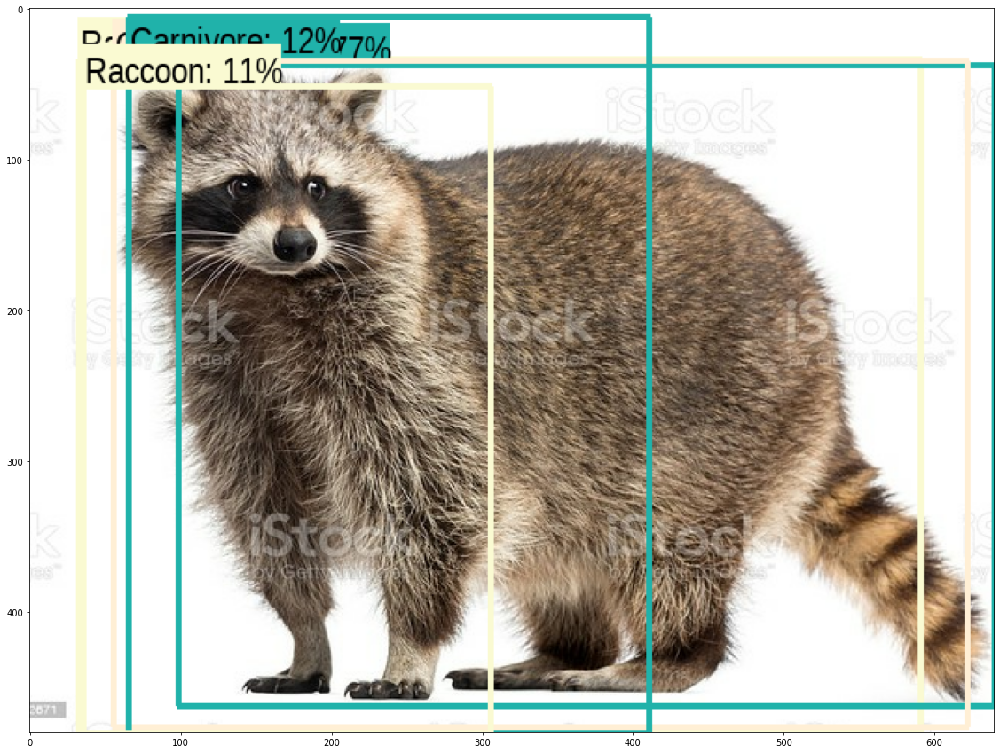

In [ ]:
detect_img('https://media.istockphoto.com/photos/beautiful-procyon-lotor-commonly-known-as-raccoon-picture-id453662671')#jpg?

Image downloaded to /tmp/tmpbxaydy13.jpg.
Found 100 objects.
Inference time:  2.7259318828582764
Inference time: 3.041933059692383


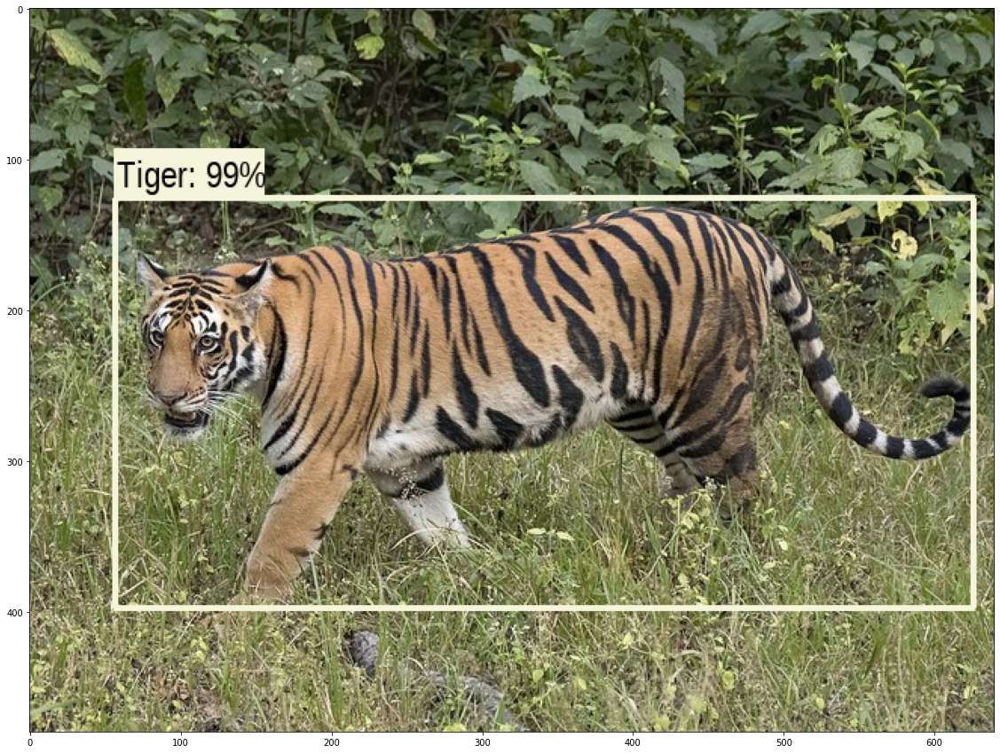

In [ ]:
detect_img('https://upload.wikimedia.org/wikipedia/commons/thumb/b/b0/Bengal_tiger_%28Panthera_tigris_tigris%29_female_3_crop.jpg/1200px-Bengal_tiger_%28Panthera_tigris_tigris%29_female_3_crop.jpg')

Image downloaded to /tmp/tmpdo4cn9n3.jpg.
Found 100 objects.
Inference time:  2.766462564468384
Inference time: 2.8559231758117676


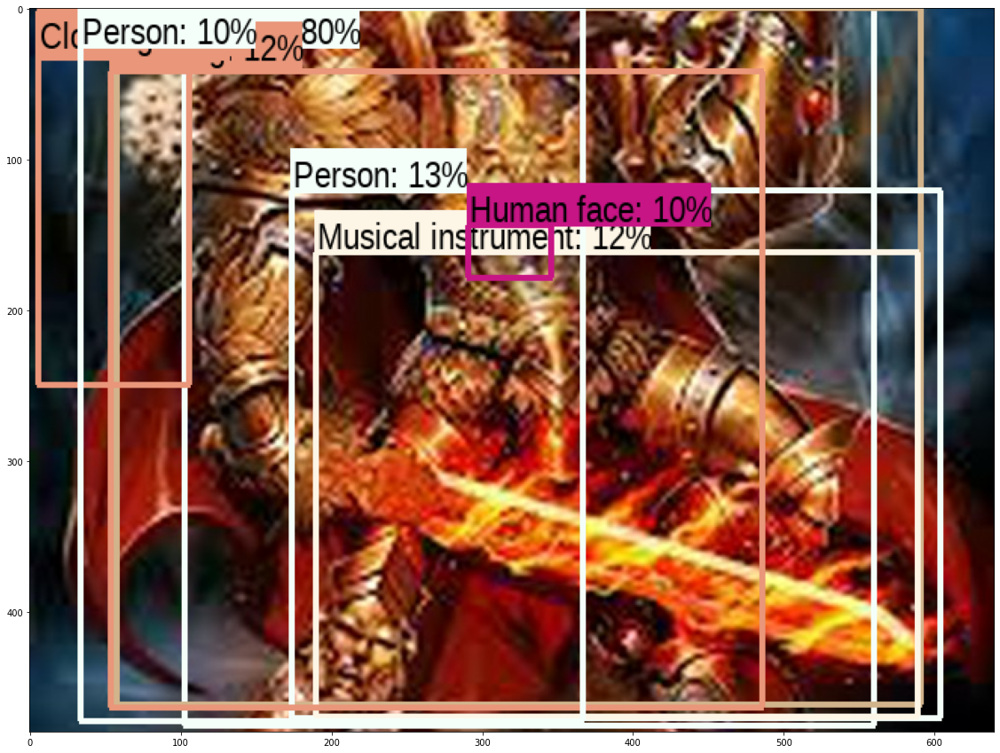

In [ ]:
detect_img('data:image/jpeg;base64,/9j/4AAQSkZJRgABAQAAAQABAAD/2wCEAAkGBxMTEhUTExMWFhUXGCAaGBUYGBcYGhcXGBgXGB8YFxgYHikhGxsmHhYXIjIjKCosLy8vGCA0OTQuOCkuLywBCgoKDg0OHBAQHC4nICc2MC4uMC4uMC4wLi4uLi4uLiwuLi4uMDAuMC4wLjAuLi4uLi4uLi4wLjAuLi4uLi4uLv/AABEIAQAAxQMBIgACEQEDEQH/xAAbAAACAwEBAQAAAAAAAAAAAAAEBQIDBgcAAf/EAEIQAAIBAgQDBQUHAQcEAQUAAAECEQADBBIhMQVBUQYTImFxMkKBkaEUI1KxwdHw4QczYnKCorIVU5LxQxYkc8PS/8QAGgEAAwEBAQEAAAAAAAAAAAAAAgMEBQEABv/EADERAAICAQMCBAUEAgIDAAAAAAECABEDEiExBEETIlFhcYGhsfAUMpHRBcHh8SMzUv/aAAwDAQACEQMRAD8A5cvFmA0t2pj2sni/8pkfDoKDLliSdyZ6amoW1ouxZiqDqfmTjSvEuw1iR5j8qYtaBgQI/pUcEkGeW/7iibFrUjz/APVeKbzuraN+HWV3MBVEmmNm13uYnTNoREmOSD6E/CgVEKqjXmR11gD4mi8Zda3bISGbbTUgtux6E7D18ql6l+0ZgXe5VjrwVfs+HAAGjuDud8snlOv8EH8A4Yc4vElUUAFubH8IGxmkuFwZTPnVs8qFXQSGksT1jLHqa0VvFtdC2kGVVEenX4n8tOs42ZqFTUxCzG+Li8gXDjKEMtbXSPMR7Xr8qZ8B7NSA5AA3kiZ+HOjuyvAQgDt8B18z5VqwJ0H89KmVC3PHYQ8mbRsOftA8Pw9EG0+Z/bajA3QVPuwu9WZwIpy4KsEhZG2Qtud5WWPQ1U5B0I+Yoprg0qtoJiu5MVfta4IPtEXE+BW7gMAAnrqPnuKw/EuzzWWzIMrjY/qP3rqbWY2+VU3sOriGHp5GknEymuD9JXj6mhTbj6zm2I4dauhbl5QLoHgB0znYd5GwmIPPT44Pi2GuO7G57YmVOgAUTpyA00HOa6P2m4W6uX3b6EdPTyrHcbxq3FWQc6kDbVhr4SeZ3A6yPOn9M3/1z9p7NvxF/DOH2youW2ZXUjMCdAeR0HsnQc9/MV7idvwMmRcwMrIBysCMy+kaihWZrF5yDnCtlYwQHBEwen70djL3jVfxKGtt1AOk/wCJSQD5P5VsYnFVM7Ihu4Hik8MEeIacvjSC8kctf5yrTY3xKG2nf12P5UkxFvxE9Nh5nQfzzrQ03tI1NQLH2hAA3/XmaS3lp+6yp+Q/U0qNqSfKllb2jdVbxcUr1EXbMGvUGkw9UMwlrnRbLzr5ZWrLnQVbo0rJNVtCcLGWeh+hplhU1U/A/DWhMIoyx1EUxwh8BPkD8dqQBsTGMe0JtXfEG5AknyABA/X51TgLXfXw+wDAtGsLO8DcDSaJwoARpAMyPgAF/M1UqIUJGa2yCQQfCZZVJPMTP0NZecy3DGfHMTbuX27oypjXzAgn6VquyPB8zCfU+g/n1rKYSyhurl10BJ/EeceVdY7M4cLbzRvp8BWPk8zhZpKdCFu/aN1TZRp+gopQAIquyOdZjtjxs2rbkDRFkmYLMYC2xG0lgCeWtUK4xLq7nYSRUORtIj98TmGh/rFCve0mKxnC+11oYO07sDcTKlwAgePm07KDvOwJA0rQPxe22He6SpIUkqrBpEHL7PUQfjUmUsSSZQMWntGaXgQIq+1d+FY3sHxi5fw6re1dfCWO7Mo1nzKw3xbpWrHh150ndXInnStjGtl9Nd6F4jcKKXFt3j3Uy5iPIMRPpvULT6+dGAk1oplGRNLfKSFdJuc44x/aBw+4GtO9y1dX3btq4hXyaRpWH4q9tyzW2V0beNQQeRB3HlXYOP8AZ/DYoFL9lX6NEOv+VxDDnzrjnaTsicHeYWnYjcHZsu+saPA8uR0okVWNg0Y8N5agFy5ct2yUYvYJAe2WJa0dIZGMkITA1kA6HcUHiWzWy6vnKXA4Zt4cZHVx5t3XkRMU4tPbCLcRhnAyYhDrM6HJps4YCPdk66TSvu7apdzlczWwF0jM4u2jK+YXOY6TViDa/lF3vUOt3Q6kjZlzjyPssD5yKWY3RBO5lvidqK4bhz3KuSMrXGVV5lSAC3pm09ZqfEEl45T9FH71q9M2pPpMzqFCZK+cRDQkAzAj41Q1qKLC+IeZmvX7fOmovmMB28oixlr1Wuteo9MDVPueBRGFUbmaXh5NNbQhRXV8x+E63lEMw+SBOb2uUU0wvdZCIcaxy/EKU4M/8v2pjYP/AD/WpSPKd40ncQrG27RtJDXBpJjLzM1VhsPaHO9DDX2IMa61Rcw7ZQ2UlRqfi2hjmI0pngiJkiBlMabaT+lYnUc95p4eO0fcEtWWcEd5/tiuo8NUC0sTEfrNcy4AQWkCAWn4dK6bw5ptL6VnY7ORvhKs3/rHxh7HKhMTAmBuYFcr7UJeIa26Ei9dUFEGqkq7MuYe9DKAetvz13nFO1WEw1y3ZvXlS5c9lTO2wLR7IJ0kxUsBcsXg122Q5DNMaEN0IOoaORq3qE1KuntEYGOO2ImS7Kdk2sW7tsnwNBV49pSuUoynckEyPKmmD7JYayjgIwzIELSAYzBummpFOeIY9bSzoNdJ5mCST1O/y6CsVjOLcRui5csJafDZpfNIuMqaOqA7SBGoGx25QqC52P8ARlAbI+/Aj7h3AFw63GQsy6ED3g4zyTyjxLr5U/ZPWgOz3FrWKSV3yz5MraTPMyNRyPrQ3a7tLbwKIXVnZjoq6QBux8tR1NeKXUUzOz6TzHFpgTpNQ4h9pKZcMLQY73LuYhfRF1c+RKj12ofg+MF1Q0ASAwg5gysAQytAkQelHYvidmwha9dS2o5uwA+pqro1OsGJyijU5v2i7CcSvMDc4iLxPuHPYQeQW2Sp+IrK8OQp3mCxD92qB+7WVBF06FUdtMrAzGxMHnXY8LxmxiTOHvJcC+1lYGNjr69edc1/tAvocRlcjMAAoIDHMFkOEPtZSZ6aGSKe7EkqB3/iMQmt5jbGKBwZa6rJdF0hYXwsogGASJIeZ10iOVQz2LlywMxAWyS+fVXujvGKqNIkiACTOaPW3jmGxF7EXAVUMZuLmcBbiRmBtFzLBgSRqT4iCZBqOO4EcLw+3i2ZXvXXEKdVsqRnEKRDuRBkyFnQE+KmX2Jrf7w9IG9fglgZEv5Jbu8oZU8M2yxFxljYCcxidiOpojiHcSxm4PCTsOZ9aVcOXP8AeMSWyZp2kjQ5up1+OvPdlf2b/wDGPzNanSrtUyuram4iu0qZ/e0HQVVi4B0JqdkeM+n7V9xu9W415kjtFjGvVXdMGvtdnJRhE1pkpoHBnSetGZqFaVYTWWhvDhOm+tNcEvhYxtJ+TClvBnhvhNPuFYK5cc27a5mK7c45n0qIuASDKdJIBElfw73LSrb90mR1AP6VqewvZ/Pm7+04EZYYNluSCcysB4Ygjc7097KcItJmQqDeUA3NQwRiBABIkSNdjz15Ux4gpF6XugWlUsuTMriBrJBKuAQTEaVmuAxuX4wQKgeH7NLaykKxJIDIrKQmupzNlkAE8pMbVoFfJoFYiDEAQI11M6Tpv0rmeJ7dWLQujDsbt1nYW9AOma9cCgCJGg3bKJjcRwvHr2Lsm6L1ywHuN4VZnhQAoDFmESVPs5VJ0idSs6MQLVKVxO+0xPG1u3sVdvYkFbzkEoR/dqyqUWTuMpAny+NdN/szxOayzBst1QLbjk4/+NyPxQGWeZE86592kt4owxPfW+TnbpEtqPOJA0B6Ux7JcdykEEDOrIY/EpzCep8I1/xVPlOpdQ/6lnhAqU7zX9vu0Zs3EAynKpLWzD52aMoZeQgTr+IVDA2L1uxbRuIlbmICsgCW/Dml7mTwy0ltTyFc940Lt/GXMgLlmDpLKJW4CxWSREZis/4K6Pwi232e3avNbF5BAyXM8KuxK2wSCSdQOW8jSvNSIAtRQShRiHsv2qTBYo2b6qQge0b1tdWyt4WuASSMgUcyMgqfbLtravXstpbdxAI7y6D3Y9AAGcCSSZjlrWK7U8Ou28RdYOtzxScoKnWD7D6+msmllg5T3l23cKDUjuzl5QCWEASR8YqkY0eifwxTAq+ofgmy4P8A2gtYhGuhrSHwLbs5FjNMJDLCnofpRbrf4vj7XfAWrNk5u7LIDcIh8iLmOZ2A1OoAzHyODOLfEXVWzbFvOwWWYkAsQBmMAAa8hTf/AKfjcBiHVGtFrdsM7g5bcXCBlDkrDFpA1BMGKdVQSL7Tddve0jqoK/cYm5bh4ZWe1azE5c6gAazr65eZrE4DgV62j3ri5WfXx5gwB/7h3lj7o8R5kRFB4bF3S9y/nLXFuKwuOQ/3gEqCxkE/dkCfwabUfbv4nid5FcvcZgHgNAABCE9yCocAgE5TOrHXak6WAAB55P8AoQgAL22Ejjsfj8LetFVzZsOq5e7VjkuZyVgCUlmYgCJB2OoobF32fB3LbTCpbcayMygqSDzBB38963PZXHNexl7u5K2UK23UwhCKlsuqkhTLJI1UEcwdTj+2WJy37xzBlu66AqweFzOyAQuZiwIknMrEgGZ6wDHy1Yr6QUbTs3B/3AOzhlGHVQPndtUZjAPFv7P1BoHs6wCA/hInpJDxPX2T9KY3X8XlJH/lr+lanTnyzJ6z98XWRqx8qGxDk0ZiBlA6mgmfSKswm7kmUVUCuA16rCteplQLg9luXSi1Mil+Fkmi0P5H6VKz+WUBd5p+yfZ67i3ItwqqJLtMekjnXSeGcEWxajEd0WR5VyM2UGJC5oysflrSf+zS+owtwoj94J945CRsI2E9SOtODddsKyLb7ssAA2GObJm1JLgaQ7NJAMCTWXlYlppYkGmKOO9tUw+IcW7iu0qpUZQiwuue5rJmBAGmo10FZbtL2txGIRraB1tMczsqsTcaANJ9lYGwgE8hVHaPhF21fJyuEtQqPeM94cq+x4V+7Bkga+9EHZdbus+pcPrzAGgPIch4SeWnnunf5ysBdpHhvDGLW+6OV9DLB1KdSyugDJylS2pExmArr/ZTs5btWglth4pZyRJhhqqrPgB0BAOwjU6jnaPIUAwRBJGpAYAyOseGdtSBz01vCMdcyARIjQD2W08oB9CDUmZ2BBPEo0grSmXdsks3w1q0xPu3HtsIAXQoNIG0HkACD0rl1/usPdAs3C6aNJIYTscrKAGGh1GmnlXQ7/FSwa27phiB7ByZ432OgWOgPUNzrKcYwNtrTAKMwBVXjK0iWgzrBJaZ6z0rmFtyG4MYFIArkQBrJu4iyNDmDJJ19lgwI6zniOe29dA4Lw+5ZeELFgJWBIcZSQQEJ8j6FvxaZZbYF2wNDF5RDe9O4IO4hK3PGXVCtsA5YzsxJf3jCrmmNFfQRObbeiJVyFM5lZlJrg/1Mb23w5uX28DDvCCmg3yJKjWAM2YEdQD65fFcO7vw3LhVWU+IBn2IYKygjwkruJiNtK6h2lVHs2gxIuL4pykyIKb9fZB/01nLfC7V64yXQ0LaLZVPtkFRuTmy+IkxG0AzRdPmFG+PzeKcalFczCojWnK6AlcwIMgwdGU8x+3ka3F/jdwYqywvXFs3bUvbRioLFiSoEwpIcAneB6VjuN2gtxwNxDLAAUAaFIGg0Obzj52veOawyySqkgDXUi2F+OYg01xqo+xhKaBB7TV8Te1hnazhibzXWBxDXVV1CoGIw4UiHILEs51BURBGinEXGtlm8CYlrSrbtqpRsNaclWZVBOS4y3BAYloctp4aNxWF7hHueB7ltWAV8oRwyka5z4yDrGpbLliW1jhOzXf31YZst9hdW4NH+8Mll/xDMwIPNSDXEcBdRi2XzaR8TNT2cwow2DuMoEjwSNh4ZM/TTzrn2Evsb7FYJDGNFYDQr7LCCCunyI2rc4vHtbwN3DXALeIwz5buUDLeDkMt5BtFxVbTkQdBtXPsI5XvHQw4HeLrHsHOYI20BPwpWFWV29fww/LkAvYfaMGuZLDJpAdQRlylWIu+EyA8iDIPURvQq3M2X5/H+CisdcdsMxua3GdXJ56m4ZPOT3o+fLahMMMiBvL960kyNW/Jmd1GJA5ANgSHEXBMdNRQOaa9cuSfiB8IJr1m2YB5GtLBsKmZl3NyUV6qr1+DXyqNQiqguCferNRp5f8AI0BYua0UcSRA0OskHrUDGxKgu82XZjjwsWmBLAqxZQGYB5EZGA5Eka09TtOwsLbQPbv94t1rapmV0Y625Y+9O4jcQK5ricWW0HPpTPg2NuteQBwbh8IZpi3O9zQj2FzNPKJ5CpciC7EqxuQKMe9q+K95cvZnzIHMZjlIIMZLbEfeAEmN9PZIArPWLVzdQdfGDlJzDNvA3XQgwIkHXepYoEu/d3SLeY92rKp8EnKGAjXLE0w7L4G894C33GdjABNy0zGPdZAYMUnINPHMqwnVzxJ2sZlBIEEDQh1zCFnxhoAWARJ2BWQCRTO5xYW2QxaL6o5V0AuKs5ZVpZXB0gyNxmGQxpcJ21t4a4bV5LjMFKd3h7mGxS5pHiPiD5liIgbmQTEIuM9rbg8Xd4tU1AJsG2CDMkjPE6/CBUzIxG6/WOXIL2O08cfF0PasMiMC7O47pA0FsykTq0ezA1I5kivmGv4W4l/vbvd3DkyWwJXxyoGaYEETtppGYeGsTiOM22uG6vfG4de8Bt2GGke4rctJEfM0VguL4cQz2JuppbVjIMDQlxEKI1XKSdIImVZ+n9pw9SOLju9iXkOqkEXQyg7tEtAA56qN9JrXXcZd+0Z7jIoBVYuI7wWzZQgtMCWI1A1iDoCprNdjna893EX0N68wyrP91bXbRQeRMZdAOsma33DbFz7oqqtlVwVbJ7byy33YGFtLAUAScrjnAqR6GTQOY9sh0ayIGl5L1tbgcjLGUZNUJzKAraHTLcO3uHnSp8SQLmVcxAP3ndtnvHfUnwjXkqwYHpTD/pz3bl9lvYd0Rd0c+NlVENwQCFBZTmAOhkBtJIXZ3FMcO+e8HuI75bRgG4l1hckayyjWBupLT4SBSzjq/aeV/TvOf8exCm5kY5NgSPFlDEkkhT4wM22+lMOJixayJbuwyXEhYJfKgAFwsFyGVMwDzG9K+OWT3zM7ZmBb1i2pYx1A60hTGMQqsZyiJ97L0B8p+XpWoMWpAZKc2nIwM6AeIWnz23vWlibaqWhLbKWXOMqnQjKxBIGhErvWrW83D7gUXLV7DG4HIh8+GfEIZa04bK6S3eRGxYiJE47hd7DC13Ytpcbu8oOUBs86w+/SDyFA4LGXBhO6uMxGd0tRHhtqyMSJ1jPmAPWRtSV3UrXHrCddwxPPpDu0WLIusWBBKd2xnYhs6k+Ul1nlmFZKzmZ3A2VST6SB+bCjeL8Ra54iBnGjjl6gfhOp+MUJw5HcOq5QHGUsRLASGgH1Ub0eHHS1O5cm+00+HVVw5Z4ggWwp5nMlxj8Mkf6xS+7dBBymQBRPGXKWUVz7ZJ2A8AVMpXoCxunz13FZq1fNtt5U/wA1qrCulrMh6htQoQhf2PyJH61fdfKhXnVZxBzCFAEakbnr6VbdskDX59RWhj9pnv7xcVr7U7u9eo4ESztRuHWWJoIrRWGbw1EBvKzxLGGulMOH31syxIllKkETIJEjbSYg+RI50Els5S2+sRVuEsNdlVA01YsQqoNszsdFHmfTUmKFhUJTGqYY3FF2Mqk6BRqQDlLKsagNpvvTTgwd8R3NvIBc8DEZs6I5OdVcNlLCyGBaPeME70ss2lch7dwkAJZGjBWKouZwDrk0mCBuWgctNwbh5c/dDu0KZc+k+InOQPfukBDJ8IBiQCBUWVwG3mjhQ6LjzgdvBBYwzL3tot93YuoGMeFs6XQLlzrK81mQIpB2q43euAk4hSjEIWgkoILy4zGDEgKJkyAZmNB2jw+EfB2V+zIotoAl5Rkurqe7yuNZywxmRJPSuaHFPmy3YIYkPcZWJe2ozH2dzqpnrkadCa5j8PKbA3nm1oN4nxGLGTu0XKpMuTqzkaiSNlG+UaTqZIBFiXQUU+0+ugnwxEE+s/nQzLpFUozIZBg7T66VYOJK60Zvuy19VdS7mzILTm2gasB1gHwkHMNNdQHnEe1V+/NrDsLaqA1y6IhAdfBm9pjMySYnTXVcRhrqhgcsqyg5WUNIZVJHigEy0AnrI1itFwvBrbJyq122wyeGWJZJAZVmGIWM0dCw8LA1FkRQ+o/KWKS2MCEcPxd3AXIxGdrbowzmWBzSfHO8HmdpgyCsKLd7EZWxdsMLaGMuoDqBLE/+IIPIhY1JrYYLAJjMMe9dggBRAq++dAbkE6CI25nUUp41gBaS2pJIED2ZVWIiASdtzA6zua8ukG+55+U4SSK9JjeMcQW4XuRlYpkVNSBLCSGG8/eHWIzAa70hC/AinHGMKFdwsZVYKNpIIeCfOFHz+JXKs1UtBdoll1NZjjg2OZmcsWMLNxVOUuogZwY9pSQx6gHUUVxfFsxCo2YGAiquXKIACIm0SAdCZOu5MquD3e6vqWJCmVdgSCEcFSwjms5x5qK0FwfZyZAJGkiAy7gxH5igZaNiEGNU3aCrwFtGv3ltaTlgtcjoV0C9dTMcqiuIs2hCSx/Ewn6Rl+lCYq/m9g6dDQDV1Qe8W73xHmJ4ot/RzrtMHxevn50tOGgxuv5VVhRBmmeDtl5A5Df01iqVGr4yRvLDsNhQUnnQ+L6dBRGEUgGaWcQxYE1XYAktEmDXmE716lV67JmvUvxIzw5Ir5VOxzFWsn0qNtPEANSTA+NLhg3GeGTKASYVdzuSTyUc2idPiYAqjieJzAAKEScwQGZbbO5959fQbACi8REjoug/VvUx8oHKleM1IPKpmy62ocTTTpPDx6m/cY94NeASzqAAtwkdWYlSSf8AIAPlW34GiNZBusQCviCkABNyCSD4TJ5ag+dc/wCEkZAZCsGYK0SYIQ+KdMs7GND1Gg6JwUm7aBt2LmIQt4yq25RwJlrjMsGeeYHrGkwdYCaqUdPQBsyHaO8TZOYZU3aYEKWAVToJI0kSDm8IJ2PNuMOcyiZiS3+diJ18gFX1U1tO0uKvJaYqsEGBJtuy6SWGQlQ4GYyJIAkR4icTdtaeg+m0+m3zFd6YBRcPINV+0XmqsQvOrrgitD2bwFs5r94TbtEEKRId9wpGx6wd/MAg2aq3khTVYjvAcPw923Z/vCSlsMy5Sistq2pkFeubduRo1eE37SlsyZlXx2pJb7tyWXxZlYBuebUkGfxJcRwm8MxS5dGf2obwEmcxKH2ySDB0khz7sVbisRi7EovduFEB7Y7u41oeIxBhVyqRlEQGEDpJk8zUGBjkBRf2n77za9lL9xXuPflAzRcZ28Pn4lPiiBrmAGonkPna/BwCO7RUk5fuGUnUy6r7UazPPX1rFYLjd264uNok5EGZbZa7CjMNCBlBUTPPQyTT3tJjWv4bCX38ZtO1sq4bxlIyl/eB1UnmNaQyMpAPrGqATqFTI3MHbFstduzmJZSgHugSDPiDHwkchBGuYZlNzh7iGjfoQZ0nYE8gT8KOw9sNdQZ81rPmKiTDwSEBzQ25jxa5WAPMuuKtIYhpJgL4iMyaSDGpEPnUglsoIkwKs1lSBEhQboTK2h8xTXH2y1tb6aiQlxdSbbhfDpyVlUwf8JmTNaX/AOl7tlFW4M9wiSjjvBbB2QEjMsaTBBG3WhrfArtkZntsVuCCik6oYIgsPanKwBmIHM6cTMrMQIWXGDjs8zL3UDaiQY16g856io5PxfA05uICoMMAZAMAzEgiV0kcwKo+xEnTUVWN5nEVArGFO3nWp4Xhgtu3PVj8jr9DS/DWMgg/CvG++RQJ8LMD8RP7VRi2k2XcSvj+KFvMF+HxrIXbpY9ab8VtM7AVG3gAvOia2MFaAig2D0r1NLhA0r1c0ie1GB2m3Bo7AWYJPy+P9PzpYwg04wPsj+fzYVPnakMu6DEHzC+2/wDE9iOlQ7iVIqY1k9fyq3G2yLIjmT8hlH71EDVCbbC7YwLhqLmOYwAJMEAmCBCk+uvlNa3gfai+FNjDqt0Fch74DukQ+6ttYzH1kdAd6Q8G4RauWXuXHYPJW2giGyoWYtIJI9lQB1OtR4bdKFSmmkTIAUjqToIPWjyAEHuRM1b1gHYGMOI2cUX7y4ylreoyIiQyMDlUooOXLLDyK9aS4dSQp6AiOoOn7D1iuuX+G/cLfNtyAuZsoZQ5RXzwPaytnt20MS2SVEZScpewly+xa5bAc6lQJAEaE5M245japhmK7MJSEB/afwGYjG4cgSf6fA7GnPDeIgIltVIZCWnLmMt4SRGs5SdeiqOsl8XwluyvfODcXKIWQQzE5QGEytsAEzrOgozgfCWZmbMveOcxXMrEM3iKkrpmEyRAInbnTHzAY7h48GvLXtZjrheN7tQM3dgqLd1z43gJ93cVhJQHOyyBoC8EaEK+0PG7QRwLYV4yzmkyGAzx1IysAOYbcU+xHZ6ymGIvN3V4mUK9DMi5HuMYOmsgEeeA4hgWMAOfDIYNrlAI5+9JJ25eVS4SjtuZW2Bip0C+1+se8KweEewmUDNbKqz7K7XNSp0n2ngNHwIGrvjeIL8PtLbYMjOy5SB3iELGSeSkeugMHLoOdYIFGZMwIDAAg89RI9JJnlJj2q3PF8B3eDtXTBEkghjmVy2bL1GsvPViKPNSOBd3Aw4TkQcDevv/AFM/jXt4ex3KgubgYZ0/7qMusbgBssc5B60T2LxAa+L1ySLJzAbS+g1gwYJBEjYtWTxWIJLEeEyCCBqSDrLbzznypjwbiuqgrlyg899Dp8Z+pql0bwzXMlTQcuknbttzO3YfjNm6FLqpLMS3U20Et4ecsbaHyuHnQfGbdvG37NmyAj31NzEX1EMuFRiMqkwQbjkgTsJNc2t8YYLsdNTkYZoMnQkEDVU5V9w3aS4t240kZ8gLeSJEeklj8amxAopAH/M7mwDVsZs+0nZi3ZBuYdRbAEMmoR1GwaDPowII5Gsxbx+FddA9tho2YB8rdCyQSNNDlgj4gazgHHg8i85YEQqzou+oHTqPOlXEOyLXrwbDqq6TdYn7tbR18R3nYqAJ2MRJoemzOpKkz2TCnLD89veIZDnKjBjyjc+gMH6UYbG+Ya5Zg6eJTBn6Uv49gFssLdsFid3Ybn/CuwHrJ86j/wBTdR3YhrYEAMNZ5sHHiBY67x7IgwK0cXV9zJsv+O1kjGePWUX7gkwNzv5UDfIAJNTxF5AQfEvQGDJ6ZhH1ApNjMSWJn5VauQMLEy8mFsbaWEqxN+TXqFZq9XLg1LC+tOMIYtn0H/EUoZIk1ocfh+7Lpv7A+IVVb/crCp+o4Amj/jdshPtI4W1oJ3P5Uwxqfd29NPF85/aKqsJ+wprxLEYa3h0t3HPfAlmS2ocgHYOSQFPlJI5is82W2n0BC40FzKYm3lUxIA1BB1B01+MAVLD4olxcC5SWBzr7rHmOY+HUdRV1zE2W0Bb/AFqAD8QxpPirBQ6bHb086rTcUZkdSqg6049p0bg3HmyiXMpdzBV1Dg+Eu+bVrgkGDoFOg3JOu3S/3nVvEysM0nYZYjr/AAVznhGJZTmYmI2POAdfhqPia0dzjwtLJ8R91TtuVbxDUHn03EGaizYDqoR3TZl/cZoQiAq7W7bOpGXPqYOUAoNRA306b7RFcYwaVPiDg9JysG1iJEgUg4V2lUq1tyQcwZG1cqIMptJAkkesbCjzik2nQjSSQW84O/MftUeTE6mmE2MBxuCRU0NzC3uIWwyd33lskPbJKyGkgpHu67GIM8oAQcZ7MYq3CdxcLMogqhZVPOWAIJHkfpVtpLoIYWmYbyu4I5wPECdpMcq6X2c4jdS2pvOxLANkb3Qw0XbMWgbf+6U/UDDRP9zmd8uBaWiPTg/Iicgtdmyr5RqVWbjkyqR7rNMSIAgenKm/HMRZbChO/th1aSpLAkZANFIk7cp+G1bnG8ewl1WR7ELM/cupZeWZwnhGpjdt/WFOO7EYO5cDW8QpuRIt3IUnWR4QB/xoxl1sGc8cev1ix1FIFK6flY99xOSYnBwcw8IEe0ZJbmYgQJ5GhjZOYBSGJAOk7kSRqBtMGug4j+zjGXL7F1FuzM5wwYEaDQDUEnypf2gwgw4W1Y9mIa5EEnUtqdTGnStAdWthRuT/AAPnEDBjyuSnA9Nyfh6RDw9GtZiIbTKdAQJ0gZgZY6gQJ3iiDh7lq1nuWpRmIBBBJO5BXcEQZBiIobhmFuXXQKDE+FQCSo8MuwAnUGZ/SBXWcBwyzh8Kv2gAFjMAwUcAhXAPv+LL6FZ9ml58642o7kwaBQMNuwHPzmKHBkC2Ltv7TY378XkyBFj2kZt56azmHQg7vs5xW2AoEFYPgYxbCn3rh66Zp1Y+kkc54tbtvcZ7V245Yxmve8QCegygQ2v+Hoar7OLeFwNde4LKvLZRmKtIGYoNYBAkdYgULLqGq+O3+veebB5dJB+PpNn29wzrLqh7skILgXukLtLeG3OZhCMJadCIJ3rBEVo+1PHA6Em/3is6ZSGzBgq3ATpvBbXpp1rNXLwPiBBHlRqDV1Ud04C46sEyOMwoK/QjmDWdxymddwI0AGg05c/OtRbuCddjoRSri+HjX4T16VRgyEGpL1/Thk1TOk19qd63rpXqv1T54oRCsFcBu2w2xdZ9Mwn6U6S/3gVzuS0+udn/AP2Vnohp6GfkaaYB4JHxFLzrYlfQMFeM8ZxHu1hGhzuw9weR/EfoPXRRh7g+VQvyzn1NQtoVYfKuYsQVZ3rOqfJkIvYT7iLstrUWveEruOVfblklj0FfLiQAfXmJ06jcb0bCT4nNmFYS1nBJ05ADlppRdrAZoABYkEECTrvP0qnhaGI66j+fCmDJKMsxI3JgQCGgnzy1I7kNU28OJRiDVvG3YPsy1y6HeIDQAsO0+U+Ef7vSjO1XElvX7yoSEUhUMlizW5lsxPUuRygLAFNez1iMFeuKt+4q22gWgbSEwYLXpDuoO623k/hNYe7Cpr7oHrpqGHrHzBqYqXfUx+HtDw5FQ0OB/vmMuA9tXshhcs944Ji4CQ2mpzrswAEzpymadYft19qYo/gkGGZwFOmqzIyTG87wNtsBjrXduyTMEyRpM7yNweRB2iDUvsoyg7dTXcnR4GOqqJ7zmB8hOxuvXn4XOpcNwHv27DjQeMwVIXo2ikSJmW9dqLxJvIe8ZLLn3pJMxoFQDUmJmBqT5a8sOOxC2hYFwm1JITTQnUkSJHwNRwXGLtojxNHQn95ipG/x7Ekgg/zxLR1Pm/8AKtfyfrc7b2f43iLm+a2BoqZYUAczmG1M8bgcPiUYYtLdxebL4co/zBp+UVyy129Rly3LhNsAZrbWgSYGyRKsZMScnWicF2pw1xg0C2ogZGELEQAx22B0zAeVR/pepxm1sD0qxJWXBlY6GC/D+zXM2fDOEYBbZTCXjaAuSSxZc5jRS+hy9BJ56VnO2fZnHnxC2LiCYFpi8A84MMSd9Afyr46QQ1oLBHssWjfRgSdojST8qP4Lfu+IsbtppnvDnVY05GEbbc5qIZNLeIwv3lgwPhW8bbejDf6TnBuOrAZbiXFIzA6EGQ0gMogxpBPntpR/2hkJdBkVw3hGuswBmJ1MaE6CCBvIrquDx3eqExC2cQG/u1IXMw/ET7MDeVH10qri3ZXhtxlZmax/hVpU7dQYGnIj4VR+sxMdMWvU6WrIDfqNx/E4zicDexLg27R0XKAoYyAzHNAGg8XPpULvAr9oA3cqzIEmGMbwu5+Vdd492XxN63GEdO6A8K2WgnSJJJAJ+Omu81yvH9lcRb0v5lK7Bw8kDfKGGoHUaVZh6gsPNQHpyZKcaudWPdjZO9V8RtBMNjQQBrPU8x6ciNasx3iQ/wA8xSnEoFY5ZgHn+9H4W/nUjmOVUMleZYeLL4gOLJz94oJr1TcQSPOvVRMkrRlhw+p9akLZGvSmGFsyYplbwBq84rFTHTOUaxE1hAWJ66iixgZq7E8HI8Vs6/h2+X7VdgeIrOS6MjeegP7UsLp8rShyMh1r8xPn2Dw0u4hwwjxKJHMc/WtZbRT/AEqV23bA3I+VLybRuITNYR1y+EwIg+nnTjAg31s2bdq1JLlHcn74nQgkGAkEqDE+E+cXXez6XbZuK33gIOVQDKkjW4DIgyIEaieVEYm7mtYZ1BZlOVslsK+ZArHINMsyUA2yttrNZr0DtNjxi6gVQjnDcdKhrLL9jRcqw+YorgH2bkQUIGaNwAfWszx3hvds4R1u5Sblu7ak28iDMZIkDUgry8MU4scYy4k3TcJtoysmEYNmV3tlWJa4qkAAMZIiDvvSbtNjWWbllVspcz2yiAqGW4ttiWEDNMHUjn5Ck4105Kr+oLE6duJk7CZnHlrRjp0+XWq8Db0LddPgKMuDQVQ53lXTrSX6xa90iByB0P6GicS4yGeYgetfL9rN6/nS/FuSQOg286NQGIgPmbErA73xPfZSFDkeFpC+qiTryiV0O4amXEeB3LNm3eaALqkgTJy7SQQCoO4OsgE+vrelsqVDrocp8uhGo3InoTQv25oCEsLSTlBOYxM5RtIknlR2TxIV0AU3f6TS9jMTeFhi63GsqRtIgGR4GOkg6x5VosF2is21AuF7s7oVVAI18UsVPTzoDsbxRA+TvrYLoS1y7qlm2scpguS0AEgDnOgPztbZsZR9nbPpq4bSTtC2gqQY3C6welZmbCHc6hV+k2cOdNAxA3Q59e8OHbDC3mKw1knSdBptuJH0FM+G8FuYgzaxCOgOpzBiB0kFvrFcosWc2p8XVSTr8dxTTCdoMTYQ2rd5haMwsgso2yk7jTpArmT/AB4ArEd/feAvWZUUDYA9+Z2SzctYU/dJnbm4JCz5ZASaLfjPeK6YkWnsMII2IHnOh+h6VxvA9ssSrABs3ICDJ8gV1/Omtv8AtGaJayGAIkd6NfRSskaecVEOg6nEbTf135/mKc4G3Y2fU3fy9Ix7UdgbWHOcXf8A7V/EBn8RYBsq6jxHVoO8E1g7l5FaLSkLMFj+U6Sf5zrT9pP7QvtFoKFIJIzJummvPc+cVh8TxN7h8WUDkAAoHoBWv0qZmF5RXtcU/U48SAAjV6gfxv8AeVYk+I16q7ra16rgJnPltjH9hxRlvExSqw4o1Lo/hrSuYVRtY4ixMeE+oH6VTjCH9pFoE4seVQOK86WzWI5BULwmW3ouYDpJI+E7VO9eEaanYDqTsPzPwoA3x1r5YuEsG5A6fr+1R5idO00enosLnTuzOAazh0vXFDq6kFDmDP7SjKQRlAA1MSIWImsjx26ljEd7l71S0rbYju29pC7IVMkhR02EbCrMT2mN233DiUIAWdYI9nQ6DWPp0rP8SFu6cwuEFdHR1FtoXQFSXILEZRl3BmM3ONFLcy3KwxmoYO0GbEO4tFmYeBBLNmO8sZYhdYGvtRttLtFwm+yW7mZWe4zF7KknuYW3lU6xOUjQD5zVeH4uLIyW1yLADII9qBmzsBLajmSR1G1fMbiHv27LO7CAYCtlADXGI9SQF89qKlU7QdTMu8FTDEKoIKmNQQd/UAiKljAgj7xNBqJM/lUbmKuoSqXiIOknMY8s4P51RiuI39mcH1RB9QBXNFmO/VlRVQe5jBy1/nnVKiTmO9UX7zGT03025axXy7imn2g2gExGwiPhEU5UriSZeoZ/3RsrSZ28htppzqvEWoZHXkZnz038qXW8WasXiUaxQ6GB2nBlU/umx4LxhRcYZAp3ICqGLFSS20FjlABM6Ox51DiwAZoOjAmIMsogtAA9DtuszpRvZu9w3GKq4q6LFxRCuW7p18g5BRlB2DaiTtQnaPheGWSmJuPl2bvMO8jyKAfw0vUvDAj5Rgu/Ib7zM2iM5AqGIaSqjdp08xt+o+PlQIukEkH4kipYbGhWzHUgz8fWnLjo3OP1BK6eJ8u2iKHY0XdxqH3P939KHe+n4T86eokLOYMzVENVt0j8JHxqkiji7n1jNeqNerk9GC36tR6AU1cGplxemHgmpA+tC2b8EaxTyzfYgZX+YU/mK4TOgRYXPQ01KBQtsauRsNSWOpgDU0xNi79ku32RGtA5HeQpSQo0XdiTcUAzprXSewT91hiltLdnEXLeVXKZm73L/wDIfaYA7gmPSo8vUIuzd9pfhwvWsdt5yDFYC+ol7F5ByLWnX/kKDwpYlRmMDYZjA5aDYVtO23HGJ7jvyl23/eMqsuZoHmMqmZ3PKk2AfNDXEDgjR8wzk66hgJH+qRrseSA503VXLQgLUTdQTG2QtvblpTMcTsJaRe7DMqgEkcwI50JxfbwyUUhmJEQu4zDrMDSaRti06ihxoWXee6jKFahDMXiQ+yAdIJ0pdctk+8al9oXqKttoW21pw8skJ1QL7L51D7G07inKcNuHULI9R+9WDBOntWbhHUA/mAaLxZzwvURE2CbqKIscFvP7KitNgMVhE/vEuqepUEfnNaHBcZwfu3FH+YFfzpbZ8g4WMXp8Z5MxFrsXim2Vfi0fpVr9hsWBOVP/AC/pXSbXELbDw3Fb0IP5V574O5HyNK/U5Yz9NjnK7vZPEjdfz/ahH4FfHufQ/tXUr14EaFSPU0uxFgNzFUJmc8yfJhQcTmr4R13Q/I1SUb8J+VbLGYXoTSm9Z1qpd5G20Sqrcwag49aaXLPnQty3TKi7gVeq9lr1c0ztzyii7CrzqCWT0oyxwwtzj5UzSYouIdh+Go42FME7OEjwsPj/AEr3CuGOpHjBHpWuwWGC770GXYRmLzGZK5h7uGCtecraLqNNfFqwYA9Mg/grfdk8XibsJZNjCKVlHxCtcvXgY8VtAVWPEJEkiRO4lD26uKLNgaR3gZ9dco8t8uYpJ9KK4XxmMOXkjTNHjYggzm30AO7TrIJB0NZTlQQxW/z7zYRWbGVBqvz+In7ZC6lwL9sF9w23cC0AwO4yEg/6jSOzjjbYLeXLOxAgfEch+VWYx82IYhpiddokBZEbRMz5V7ilpDbYmCQJJPtAjqZ35jr9aYSqkCp1VdgxB4nzG8Tt5rgMwUywCCLh7tlmCNI0E66liPLGsaORWJBM+R9BU/s5/F9KoWkkeQnJvB8GATrFU3UIJrS4DgF59mUeoP7Uxv8AZe+F0a2fIgj6xQeOgPMIdK5XiY63dgAgxG4BiiDjLqxlusBy1pweA313tA+mU/qKieAXSf7hj8R9Na74iH0+k94OQdj9Yn/6xf8A+43xqLcVundp+ArQWuz1zY4bf/GP1NTbss+v3MDf2ln4a1zxMXtO+Dm9TM4OKXRs8egH7USnHb8gd48HQiRr9KYYns04BIsufRl/elFvBlWh5XoCCf0owcbcVFsuVTvcJ/67iNIuMF2iFMf7aje4zfBjOSOpC/tUreGU6E/Hl5RQlzDa6n6j9KIaYttXrL1x91tA30H7VC7iLo3P0FUpA/ep/aNIJP7UYijPhvORuPkKqLt1qxWAG4I9KpLUyDKy5r7Xw16uTsb4e0W2p/w/CdT8KVYJ4gcqcWGA15VaAJATNNgcLAEDXrRWU+dKMFjWGgMCtFwq8HOV4P8ANxSsyahQlGFqMA4jw8Xwk7pMTsQwhlI5qR+Qqm92MUWWFrENbLDW26i6v+k6MsSdfFvyp7f8GkfGpJ4tTqawswZG2M38DBlozmd/hN3DmQ2c9VtwB55nYR8qXtavPC5WIG07fIaGux28LbI1AJ8wK+HDKPZVfgAKWOqYbkAn1jG6dSKBIHpc5Nhuz19zOUz1P6AU5wPZNgZet8cKxHlXxcG3Q/I/pQN1DtCTDjTiJMFg1t0W5U69NgOdWXMA8xEDlJAoixwh/Iep/akmUWo7xV3XOK8LZp4OE9W+Q/Umpjg48z5k/pH61y5zxViRQKi6A9a0ScHUnYf7v/6qTcNQbqPkK9vOeKszOQ8pPpXhwxbpAe2rCfeAOlaU4VQNh/PSqjaHKmoDE5MtiZriXY7CsPADbbyY/RWkUhu9hAfYxA9GWfqD+lb67ZH9aEvwKuxlpnvpnPMR2Iuja5bPxI/SlmK7K31/AfRv3FdKuuB0pdir+lX4lJ5kGVwOJzS7wm6m6/Wvi4PTUEVrsawM0lxe2lUDGBJjlJiK7aAMV6jHQV6uaIXiT//Z')

In [ ]:
#비행기 하면 바퀴도 찾음